# 9.5 Sigma Sweep — Additive batch conditioning (decipher_*_add)

Same sweep structure as `9.4 sigma-sweep-2.ipynb`, but using the additive-batch-conditioning
variants (`decipher_vz_add`, `decipher_vz2_add`, `decipher_mf_add`) in place of
`decipher_vz`, `decipher_vz2`, `decipher_mf`. These variants replace concatenation of `v`
(or `x`) with the batch embedding by a per-batch additive shift in z-space
(`self.batch_shift`), matching how the synthetic data's batch effect is actually generated
(`z_mean = latent_t @ w_bio + shift`). `Base Decipher` (unmodified) stays in as the
reference point.

Runs `seeds = [0, 1, 2, 3, 4]` and `shift_sigmas = [0.1, 0.25, 0.5, 0.75, 1.0, 2.0, 5.0]` in
a single combined sweep (no cross-machine CSV merge needed, unlike 9.4).

Writes to the same locations `simulated_data_pipeline_aug1.py` always writes to:
`shift_sigma_sweep/<MMDD>/trained/` for trained `.h5ad` files and
`shift_sigma_sweep/<MMDD>/figs/` for reconstruction diagnostic figures (both are automatic
side effects of `train_and_compute_rho_r2`, no extra code needed here). `<MMDD>` is
whatever today's date is when the sweep cell actually runs.

## Import pipeline module

In [1]:
import sys
sys.path.insert(0, "/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Data Generation")

import os
import numpy as np
import pandas as pd
from datetime import datetime

from simulated_data_pipeline_aug1 import train_and_compute_rho_r2

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/torch/cuda/__init__.py:54: FutureWarning: The pynvml package is deprecated. Please install nvidia-ml-py instead. If you did not install pynvml directly, please report this to the maintainers of the package that installed pynvml for you.
  import pynvml  # type: ignore[import]


## Run sweep

Epoch 300 (batch 22/22) | | train elbo: 192.69 (last epoch: 192.89) | val ll: 196.36:  30%|███       | 300/1000 [01:19<03:04,  3.80it/s]2026-08-21 14:09:03,697 | INFO : Early stopping has been triggered.
2026-08-21 14:09:03,700 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-08-21 14:09:03,701 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-08-21 14:09:03,701 | INFO : Saving decipher model with run_id 2026-08-21-14-09-03-oscillating-afraid-cobbler.


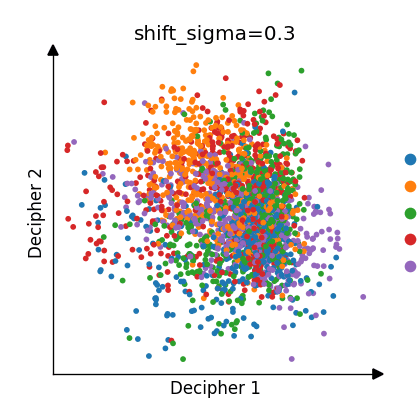

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
... storing 'shift' as categorical
... storing 'batch' as categorical
2026-08-21 14:09:04,821 | INFO : Clustering cells using scanpy Leiden algorithm.
2026-08-21 14:09:04,821 | INFO : Step 1: Computing neighbors with `sc.pp.neighbors`, with the representation decipher_z.
2026-08-21 14:09:04,834 | INFO : Step 2: Computing clusters with `sc.tl.leiden`, and resolution 1.0.
2026-08-21 14:09:05,017 | INFO : Added `.obs['decipher_clusters']`: the cluster labels.
/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Data Generation/simulated_data_pipeline_aug1.py:511: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass ob

,model,n_z_dims,shift_sigma,seed,decipher_seed,rho,trained_h5ad,r2_overall,r2_per_gene_median,error
0,Decipher-VZ-Add,3,0.1,0,1,0.856679,/Users/alanxie/CodingProjects/Columbia/Azizi L...,0.766737,0.484245,None
1,Decipher-VZ-Add,3,0.1,1,1,0.926760,/Users/alanxie/CodingProjects/Columbia/Azizi L...,0.779985,0.546052,None
2,Decipher-VZ-Add,3,0.2,0,1,0.763270,/Users/alanxie/CodingProjects/Columbia/Azizi L...,0.759118,0.528006,None
3,Decipher-VZ-Add,3,0.2,1,1,0.906329,/Users/alanxie/CodingProjects/Columbia/Azizi L...,0.774123,0.556921,None
4,Decipher-VZ-Add,3,0.3,0,1,0.712016,/Users/alanxie/CodingProjects/Columbia/Azizi L...,0.786974,0.570144,None
5,Decipher-VZ-Add,3,0.3,1,1,0.896249,/Users/alanxie/CodingProjects/Columbia/Azizi L...,0.801980,0.611092,None
6,Decipher-VZ2-Add,3,0.1,0,1,0.857218,/Users/alanxie/CodingProjects/Columbia/Azizi L...,0.764185,0.476820,None
7,Decipher-VZ2-Add,3,0.1,1,1,0.920706,/Users/alanxie/CodingProjects/Columbia/Azizi L...,0.778883,0.520768,None
8,Decipher-VZ2-Add,3,0.2,0,1,0.774846,/Users/alanxie/CodingProjects/Columbia/Azizi L...,0.716462,0.416262,None
9,Decipher-VZ2-Add,3,0.2,1,1,0.899770,/Users/alanxie/CodingProjects/Columbia/Azizi L...,0.763831,0.505707,None


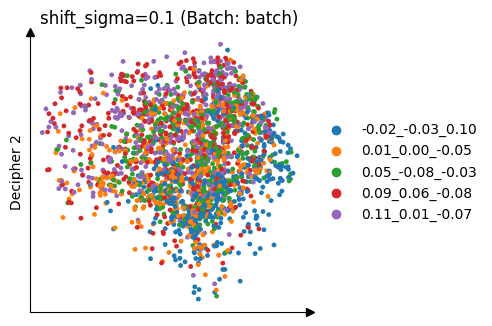

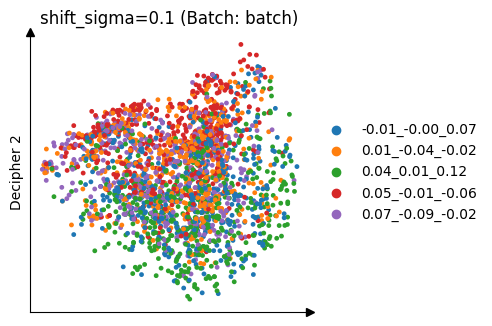

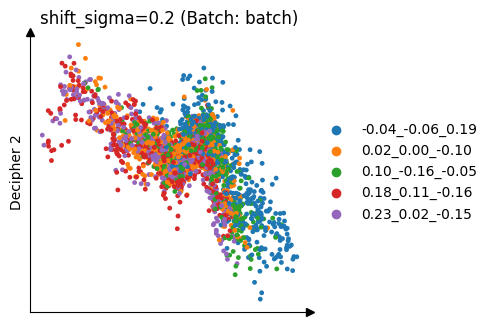

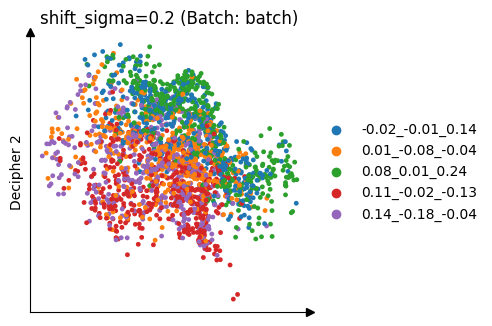

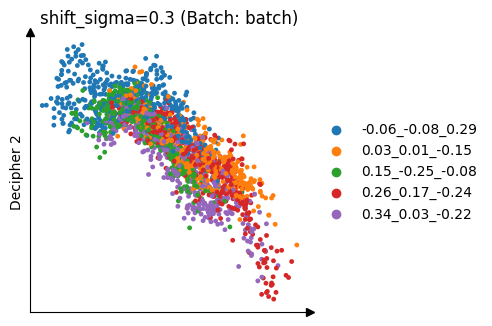

...

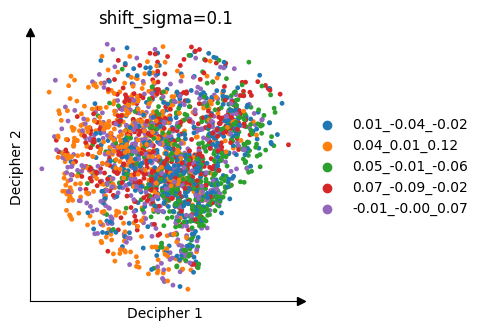

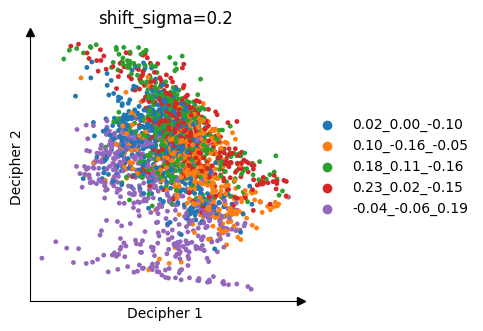

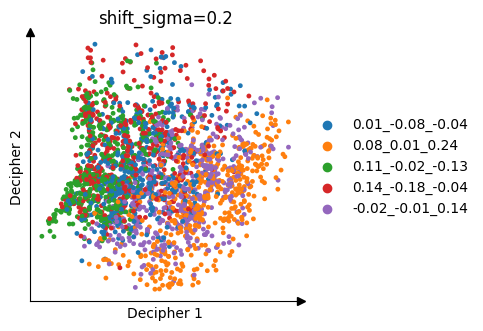

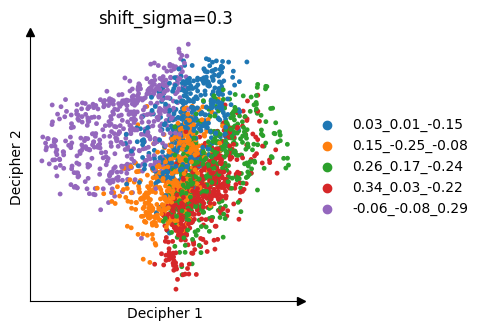

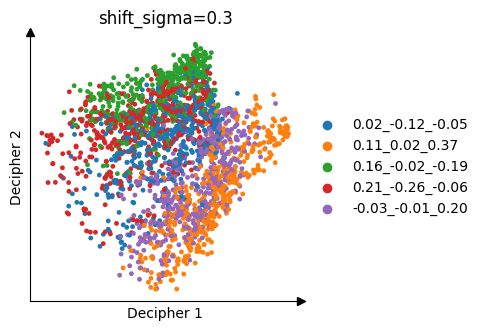

In [2]:
# ---- sweep ----
# shift distribution is MVN(0, shift_sigma^2 * I) in n_z_dims
shift_sigmas = [0.1, 0.2, 0.3]
seeds = [0, 1]
decipher_seeds = [1]  # one decipher_seed
n_z_dims = 3
n_samples = 500
n_genes = 200
biological_sigma = 0.1
beta = 0.5
models = {
    "Decipher-VZ-Add": "decipher_vz_add",
    "Decipher-VZ2-Add": "decipher_vz2_add",
    "Decipher-MF-Add": "decipher_mf_add",
    "Base Decipher": "decipher",
}
colors = {
    "Decipher-VZ-Add": "#00897B",
    "Decipher-VZ2-Add": "#7B1FA2",
    "Decipher-MF-Add": "#AD1457",
    "Base Decipher": "#C62828",
}

pipeline_dir = "/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Data Generation"
today = datetime.now().strftime("%m%d")
log_dir = os.path.join(pipeline_dir, "..", "Simulated Adata", "shift_sigma_sweep", today)
os.makedirs(log_dir, exist_ok=True)
csv_path = os.path.join(log_dir, f"sweep_log_{shift_sigmas}_{seeds}.csv")

run_log = []
for name, model in models.items():
    for shift_sigma in shift_sigmas:
        for sd in seeds:
            for decipher_seed in decipher_seeds:
                record = {
                    "model": name, "n_z_dims": n_z_dims,
                    "shift_sigma": shift_sigma, "seed": sd,
                    "decipher_seed": decipher_seed, 
                }
                try:
                    rho, trained_path, r2_overall, r2_per_gene_median, _ = train_and_compute_rho_r2(
                        model, decipher_seed,
                        shift_sigma=shift_sigma,
                        n_samples=n_samples,
                        n_genes=n_genes,
                        biological_sigma=biological_sigma,
                        seed=sd,
                        n_z_dims=n_z_dims,
                        beta = beta,
                    )
                    record.update({
                        "rho": rho, "trained_h5ad": trained_path,
                        "r2_overall": r2_overall,
                        "r2_per_gene_median": r2_per_gene_median,
                        "error": None,
                    })
                except Exception as e:
                    print(f"[{name}] n_z_dims={n_z_dims} shift_sigma={shift_sigma} "
                          f"seed={sd} decipher_seed={decipher_seed} "
                          f"failed: {type(e).__name__}: {e}")
                    record.update({
                        "rho": np.nan, "trained_h5ad": None,
                        "r2_overall": np.nan, "r2_per_gene_median": np.nan,
                        "error": f"{type(e).__name__}: {e}",
                    })
                run_log.append(record)
                pd.DataFrame(run_log).to_csv(csv_path, index=False)

run_log_df = pd.DataFrame(run_log)
run_log_df

## Correlation Plot

2026-08-21 14:09:06,108 | INFO : Substituting symbol N from STIXNonUnicode
2026-08-21 14:09:06,128 | INFO : Substituting symbol N from STIXNonUnicode
2026-08-21 14:09:06,174 | INFO : Substituting symbol N from STIXNonUnicode
2026-08-21 14:09:06,197 | INFO : Substituting symbol N from STIXNonUnicode


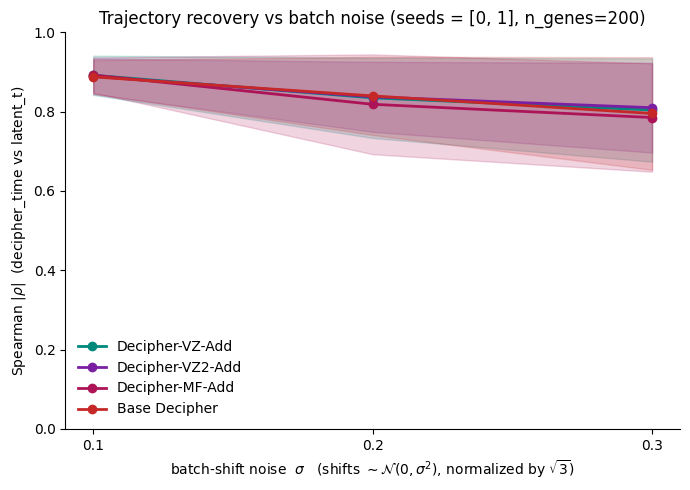

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

pipeline_dir = "/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Data Generation"
#today = datetime.now().strftime("%m%d")
log_dir = os.path.join(pipeline_dir, "..", "Simulated Adata", "shift_sigma_sweep", today)
trained_dir = os.path.join(log_dir, "trained")
models = {
    "Decipher-VZ-Add": "decipher_vz_add",
    "Decipher-VZ2-Add": "decipher_vz2_add",
    "Decipher-MF-Add": "decipher_mf_add",
    "Base Decipher": "decipher",
}
colors = {
    "Decipher-VZ-Add": "#00897B",
    "Decipher-VZ2-Add": "#7B1FA2",
    "Decipher-MF-Add": "#AD1457",
    "Base Decipher": "#5D5757",
}

shift_sigmas = [0.1, 0.2, 0.3]
seeds = [0, 1]

run_log_df = pd.read_csv(os.path.join(log_dir, f"sweep_log_{shift_sigmas}_{seeds}.csv"))
run_log_df = run_log_df[run_log_df["error"].isna()].copy()

sigmas_sorted = sorted(run_log_df["shift_sigma"].unique())
x_pos = np.arange(len(sigmas_sorted))  # evenly spaced positions, one per sigma tested

fig, ax = plt.subplots(figsize=(7, 5))
for name in models:
    sub = run_log_df[run_log_df["model"] == name]
    stats = sub.groupby("shift_sigma")["rho"].agg(["mean", "std"]).reindex(sigmas_sorted)
    mean = stats["mean"].to_numpy()
    sd_ = stats["std"].to_numpy()
    ax.plot(x_pos, mean, marker="o", color=colors[name], label=name, linewidth=2)
    ax.fill_between(x_pos, mean - sd_, mean + sd_, color=colors[name], alpha=0.18)

ax.set_xticks(x_pos)
ax.set_xticklabels([str(s) for s in sigmas_sorted])
ax.set_xlabel(r"batch-shift noise  $\sigma$   (shifts $\sim \mathcal{N}(0,\sigma^2)$, normalized by $\sqrt{3}$)")
ax.set_ylabel(r"Spearman $|\rho|$  (decipher_time vs latent_t)")
ax.set_title(f"Trajectory recovery vs batch noise (seeds = {seeds}, n_genes=200)")
ax.set_ylim(0, 1); ax.axhline(0, color="0.8", lw=0.8)
ax.legend(frameon=False); ax.spines[["top", "right"]].set_visible(False)
fig.tight_layout()
fig.savefig("sigma_vs_correlation_9.5.png", dpi=200)
plt.show()

In [4]:
rho_summary = run_log_df.groupby("shift_sigma")["rho"].agg(["mean", "std"]).reindex(sigmas_sorted).round(3)
rho_summary

,mean,std
shift_sigma,,
0.1,0.890,0.034
0.2,0.833,0.079
0.3,0.799,0.100


## V-space integration metrics (scib_metrics)

The mentor's check: Z-space should separate batch (silhouette high), V-space should *not* (batches should mix). iLISI, graph connectivity, and (rescaled) batch silhouette are all oriented so **higher = better integration** here.

In [5]:
import scanpy as sc

def compute_integration_metrics(adata,
                                v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                n_neighbors=30, n_bins=5):
    from scib_metrics.nearest_neighbors import pynndescent
    from scib_metrics import ilisi_knn, graph_connectivity, silhouette_batch
    import pandas as pd
    import numpy as np
    adata.obs["latent_t_bin"] = pd.qcut(
        adata.obs[t_key], q=n_bins, labels=False
    ).astype("category")
    neigh = pynndescent(adata.obsm[v_key], n_neighbors=n_neighbors)
    batches = adata.obs[batch_key].cat.codes.to_numpy()
    bins    = adata.obs["latent_t_bin"].cat.codes.to_numpy()
    return {
        "ilisi": ilisi_knn(neigh, batches, scale=True),
        "graph_conn": graph_connectivity(neigh, labels=bins),
        "sil_batch": silhouette_batch(adata.obsm[v_key], labels=bins, batch=batches, rescale=True),
    }

In [6]:
# Only rows that trained successfully have a trained_h5ad to read.
ok_df = run_log_df[run_log_df["error"].isna()].copy()

v_records = []
for _, row in ok_df.iterrows():
    adata = sc.read_h5ad(row["trained_h5ad"])
    m = compute_integration_metrics(adata, v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                     n_neighbors=30, n_bins=5)
    m.update({"model": row["model"], "shift_sigma": row["shift_sigma"], "seed": row["seed"]})
    v_records.append(m)

v_results_df = pd.DataFrame(v_records)
v_results_df.to_csv(os.path.join(log_dir, "v_space_integration_metrics_9.5.csv"), index=False)
v_results_df

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
INFO:2026-08-21 14:09:11,723:jax._src.xla_bridge:822: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: dlopen(libtpu.so, 0x0001): tried: 'libtpu.so' (no such file), '/System/Volumes/Preboot/Cryptexes/OSlibtpu.so' (no such file), '/Users/alanxie/miniconda3/envs/decipher_env/bin/../lib/libtpu.so' (no such file), '/usr/lib/libtpu.so' (no such file, not in dyld cache), 'libtpu.so' (no such file)
2026-08-21 14:09:11,723 | INFO : Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: dlopen(libtpu.so, 0x0001): tried: 'libtpu.so' (no such file), '/System/Volumes/Preboot/Cryptexes/OSlibtpu.so' (no such file), '/Users/alanxie/miniconda3/envs/decipher_env/bin/../lib/libtpu.so' (no such file), '/usr/lib/libtpu.so' (no suc

,ilisi,graph_conn,sil_batch,model,shift_sigma,seed
0,0.463040,0.9532,0.831139,Decipher-VZ-Add,0.1,0
1,0.443795,0.9692,0.836038,Decipher-VZ-Add,0.1,1
2,0.435694,0.6580,0.708372,Decipher-VZ-Add,0.2,0
3,0.334622,0.9348,0.777999,Decipher-VZ-Add,0.2,1
4,0.349690,0.7596,0.767875,Decipher-VZ-Add,0.3,0
5,0.399473,0.9040,0.783193,Decipher-VZ-Add,0.3,1
6,0.464808,0.9512,0.820527,Decipher-VZ2-Add,0.1,0
7,0.452691,0.9668,0.795432,Decipher-VZ2-Add,0.1,1
8,0.378390,0.8604,0.748577,Decipher-VZ2-Add,0.2,0
9,0.304592,0.9680,0.828793,Decipher-VZ2-Add,0.2,1


### V-space metrics vs sigma

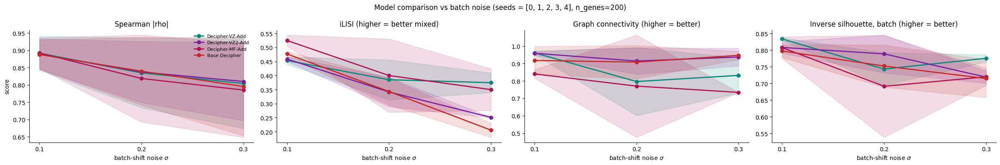

In [7]:
fig, axes = plt.subplots(1, 4, figsize=(24, 4))
panels = [
    ("rho", "Spearman |rho|", run_log_df),
    ("ilisi", "iLISI (higher = better mixed)", v_results_df),
    ("graph_conn", "Graph connectivity (higher = better)", v_results_df),
    ("sil_batch", "Inverse silhouette, batch (higher = better)", v_results_df),
]
for ax, (col, title, df) in zip(axes, panels):
    for name in models:
        sub = df[df["model"] == name]
        stats = sub.groupby("shift_sigma")[col].agg(["mean", "std"]).reindex(sigmas_sorted)
        mean = stats["mean"].to_numpy()
        sd_ = stats["std"].to_numpy()
        ax.plot(x_pos, mean, marker="o", color=colors[name], label=name, linewidth=2)
        ax.fill_between(x_pos, mean - sd_, mean + sd_, color=colors[name], alpha=0.15)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([str(s) for s in sigmas_sorted])
    ax.set_xlabel(r"batch-shift noise $\sigma$")
    ax.set_title(title)
    ax.spines[["top", "right"]].set_visible(False)
axes[0].set_ylabel("score")
axes[0].legend(frameon=False, fontsize=8)
fig.suptitle(f"Model comparison vs batch noise (seeds = [0, 1, 2, 3, 4], n_genes=200)")
fig.tight_layout()
fig.savefig("v_space_metrics_vs_sigma_9.5.png", dpi=200)
plt.show()

In [8]:
v_summary = (v_results_df
    .groupby(["model", "shift_sigma"])[["ilisi", "graph_conn", "sil_batch"]]
    .agg(["mean", "std"]).round(3))
v_summary

ilisi        graph_conn        sil_batch       
                               mean    std       mean    std      mean    std
model            shift_sigma                                                 
Base Decipher    0.1          0.477  0.009      0.918  0.081     0.797  0.020
                 0.2          0.343  0.048      0.908  0.096     0.752  0.063
                 0.3          0.206  0.025      0.947  0.024     0.715  0.057
Decipher-MF-Add  0.1          0.525  0.020      0.840  0.025     0.808  0.033
                 0.2          0.400  0.131      0.770  0.294     0.692  0.153
                 0.3          0.350  0.075      0.734  0.000     0.720  0.025
Decipher-VZ-Add  0.1          0.453  0.014      0.961  0.011     0.834  0.003
                 0.2          0.385  0.071      0.796  0.196     0.743  0.049
                 0.3          0.375  0.035      0.832  0.102     0.776  0.011
Decipher-VZ2-Add 0.1          0.459  0.009      0.959  0.011     0.808  0.018
                 0.2          0.341  0.052      0.914  0.076     0.789  0.057
                 0.3          0.251  0.001      0.937  0.051     0.719  0.019

## Per-sigma, per-model detail: Z-space, V-space, X-space

Pools all 5 seeds `[0, 1, 2, 3, 4]` the same way as the Correlation Plot / V-space
integration metrics sections above. Each section below picks one representative seed
(`seed_for_detail`) per (model, sigma) for the illustrative plots, matching 9.4's convention
-- plotting all 5 seeds here would multiply every figure by 5.

In [9]:
import os
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
from datetime import datetime

pipeline_dir = "/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Data Generation"
today = datetime.now().strftime("%m%d")
log_dir = os.path.join(pipeline_dir, "..", "Simulated Adata", "shift_sigma_sweep", today)
trained_dir = os.path.join(log_dir, "trained")
models = {
    "Decipher-VZ-Add": "decipher_vz_add",
    "Decipher-VZ2-Add": "decipher_vz2_add",
    "Decipher-MF-Add": "decipher_mf_add",
    "Base Decipher": "decipher",
}
colors = {
    "Decipher-VZ-Add": "#00897B",
    "Decipher-VZ2-Add": "#7B1FA2",
    "Decipher-MF-Add": "#AD1457",
    "Base Decipher": "#C62828",
}

shift_sigmas = [0.1, 0.2, 0.3]
seeds = [0, 1]

run_log_df = pd.read_csv(os.path.join(log_dir, f"sweep_log_{shift_sigmas}_{seeds}.csv"))
run_log_df = run_log_df[run_log_df["error"].isna()].copy()

def load_run(df, shift_sigma, model_name, seed=None):
    sub = df[(df["shift_sigma"] == shift_sigma) & (df["model"] == model_name)]
    if seed is not None:
        sub = sub[sub["seed"] == seed]
    row = sub.iloc[0]
    return row, sc.read_h5ad(row["trained_h5ad"])

latent_z_cols = ["latent_z0", "latent_z1", "latent_z2"]
model_names = list(models.keys())
seed_for_detail = 0

## Z-space: ground truth vs. learned decipher_z

In [10]:
def plot_z_space(shift_sigma, seed=seed_for_detail):
    for model_name in model_names:
        row, adata = load_run(run_log_df, shift_sigma, model_name, seed=seed)
        batch_labels = adata.obs["batch"].astype(str)

        sil_ground_truth = silhouette_score(
            adata.obs[latent_z_cols].values, batch_labels,
            sample_size=min(5000, adata.n_obs), random_state=42,
        )
        sil_learned = silhouette_score(
            adata.obsm["decipher_z"], batch_labels,
            sample_size=min(5000, adata.n_obs), random_state=42,
        )
        print(f"{model_name}  sigma={shift_sigma}  seed={seed}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
        print(f"{model_name}  sigma={shift_sigma}  seed={seed}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

        adata.obsm["latent_z"] = adata.obs[latent_z_cols].values
        sc.pp.neighbors(adata, use_rep="latent_z", key_added="latent_z_neighbors", random_state=42)
        sc.tl.umap(adata, neighbors_key="latent_z_neighbors", random_state=42)
        adata.obsm["latent_z_umap"] = adata.obsm["X_umap"]

        sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
        sc.tl.umap(adata, random_state=42)
        adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
        sc.pl.embedding(adata, basis="latent_z_umap", color="batch",
                        ax=axes[0], show=False, title=f"Ground truth z (3D), UMAP ({model_name}, sigma={shift_sigma})")
        sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                        ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={shift_sigma})")
        plt.tight_layout()
        plt.show()

### Sigma = 0.1

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-VZ-Add  sigma=0.1  seed=0  ground truth z silhouette (by batch) = -0.0378
Decipher-VZ-Add  sigma=0.1  seed=0  learned decipher_z silhouette (by batch) = -0.0537


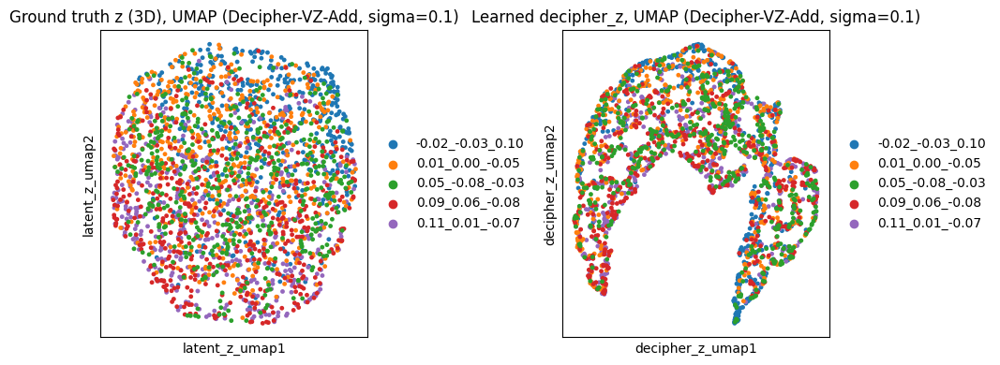

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-VZ2-Add  sigma=0.1  seed=0  ground truth z silhouette (by batch) = -0.0378
Decipher-VZ2-Add  sigma=0.1  seed=0  learned decipher_z silhouette (by batch) = -0.0540


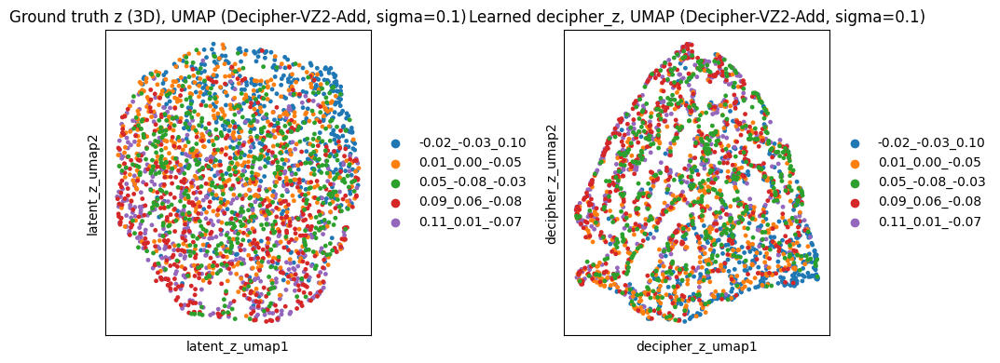

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-MF-Add  sigma=0.1  seed=0  ground truth z silhouette (by batch) = -0.0378
Decipher-MF-Add  sigma=0.1  seed=0  learned decipher_z silhouette (by batch) = -0.0585


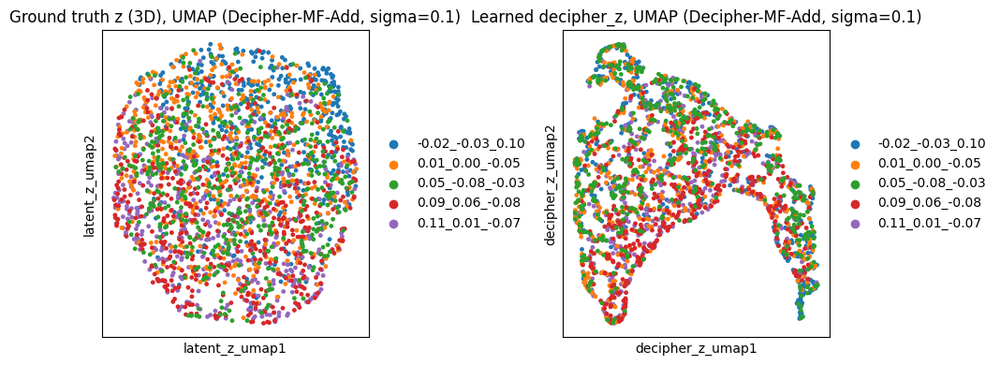

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Base Decipher  sigma=0.1  seed=0  ground truth z silhouette (by batch) = -0.0378
Base Decipher  sigma=0.1  seed=0  learned decipher_z silhouette (by batch) = -0.0627


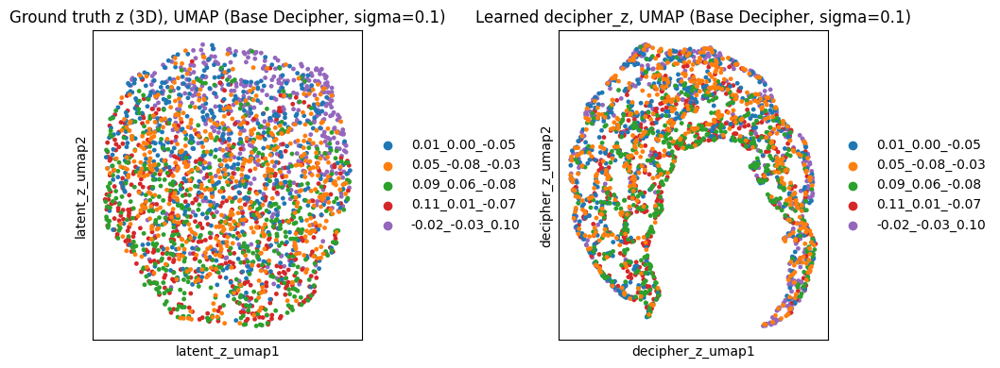

In [11]:
plot_z_space(0.1)

### Sigma = 0.2

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-VZ-Add  sigma=0.2  seed=0  ground truth z silhouette (by batch) = 0.0272
Decipher-VZ-Add  sigma=0.2  seed=0  learned decipher_z silhouette (by batch) = -0.0575


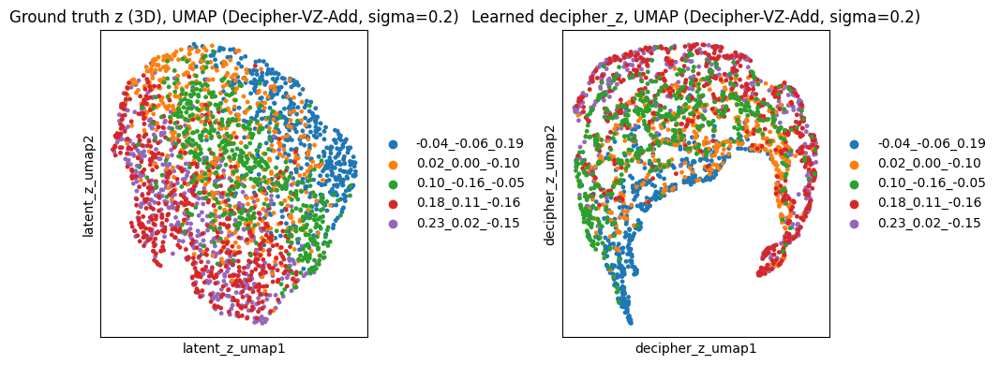

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-VZ2-Add  sigma=0.2  seed=0  ground truth z silhouette (by batch) = 0.0272
Decipher-VZ2-Add  sigma=0.2  seed=0  learned decipher_z silhouette (by batch) = -0.0475


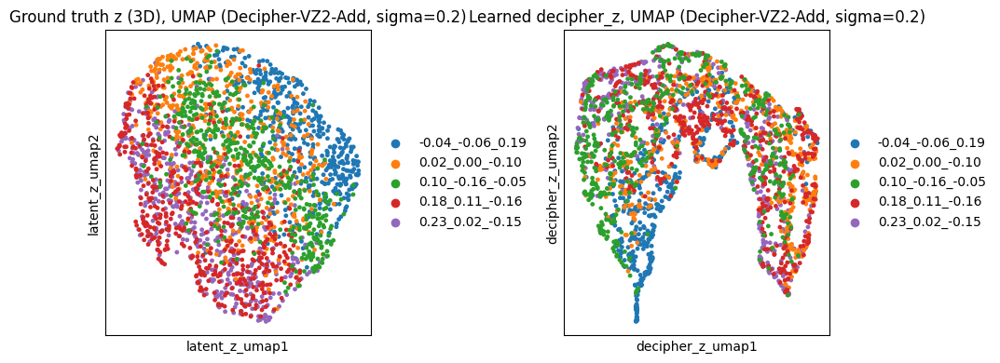

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-MF-Add  sigma=0.2  seed=0  ground truth z silhouette (by batch) = 0.0272
Decipher-MF-Add  sigma=0.2  seed=0  learned decipher_z silhouette (by batch) = -0.0055


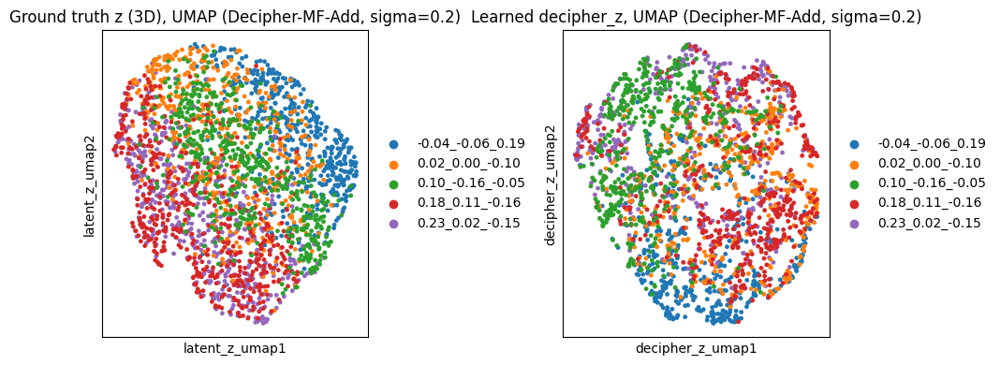

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Base Decipher  sigma=0.2  seed=0  ground truth z silhouette (by batch) = 0.0272
Base Decipher  sigma=0.2  seed=0  learned decipher_z silhouette (by batch) = -0.0457


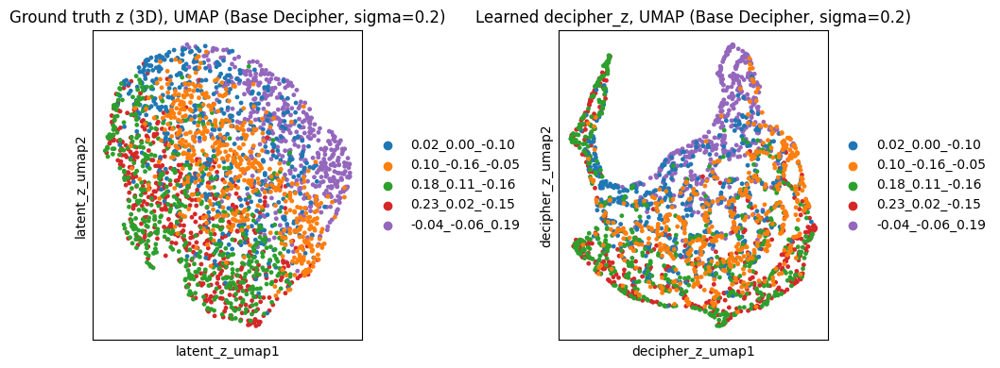

In [12]:
plot_z_space(0.2)

### Sigma = 0.3

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-VZ-Add  sigma=0.3  seed=0  ground truth z silhouette (by batch) = 0.1320
Decipher-VZ-Add  sigma=0.3  seed=0  learned decipher_z silhouette (by batch) = 0.1014


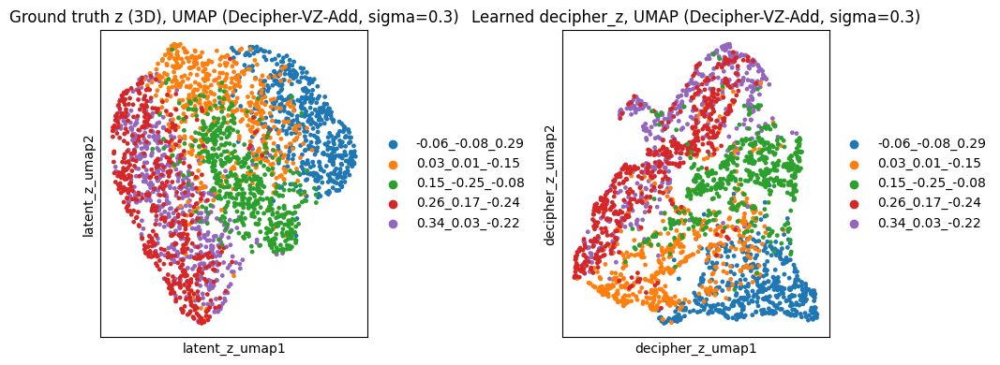

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-VZ2-Add  sigma=0.3  seed=0  ground truth z silhouette (by batch) = 0.1320
Decipher-VZ2-Add  sigma=0.3  seed=0  learned decipher_z silhouette (by batch) = 0.0385


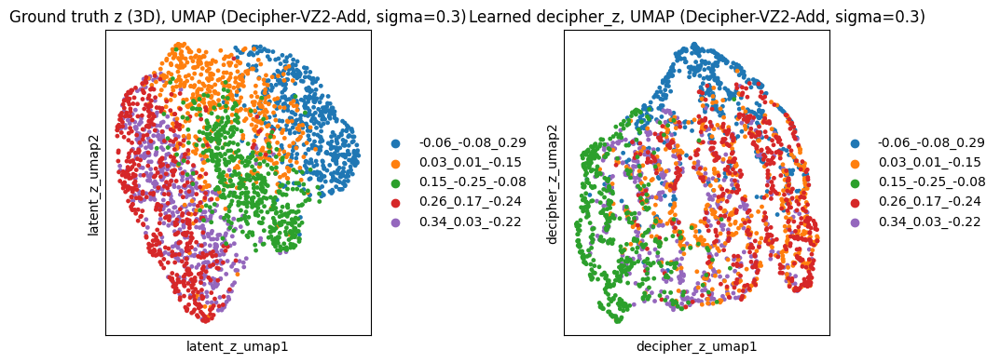

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-MF-Add  sigma=0.3  seed=0  ground truth z silhouette (by batch) = 0.1320
Decipher-MF-Add  sigma=0.3  seed=0  learned decipher_z silhouette (by batch) = -0.0202


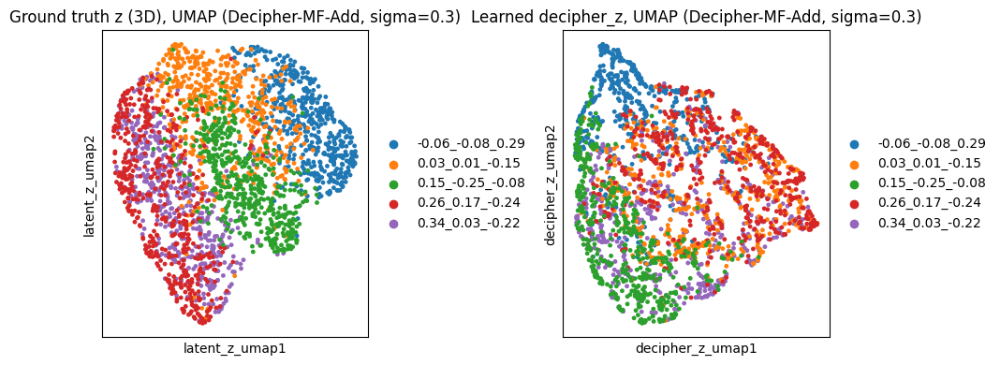

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Base Decipher  sigma=0.3  seed=0  ground truth z silhouette (by batch) = 0.1320
Base Decipher  sigma=0.3  seed=0  learned decipher_z silhouette (by batch) = 0.0400


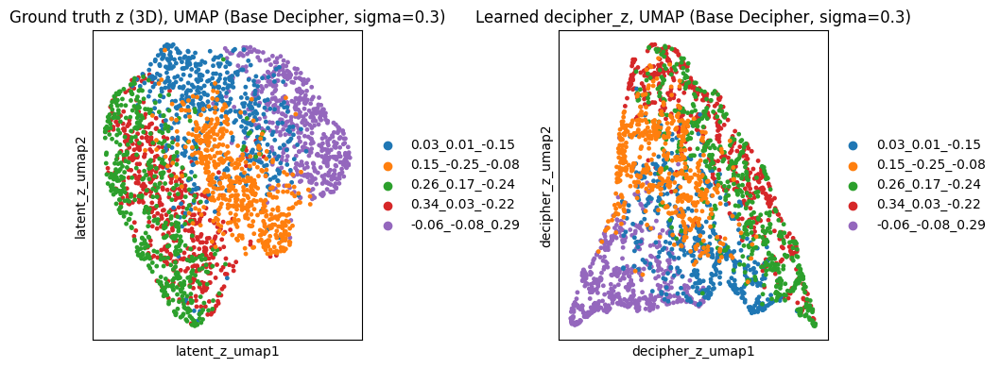

In [13]:
plot_z_space(0.3)

## V-space: colored by batch, latent pseudotime, learned pseudotime

In [14]:
def plot_v_space(shift_sigma, seed=seed_for_detail):
    for model_name in model_names:
        row, adata = load_run(run_log_df, shift_sigma, model_name, seed=seed)
        sc.pl.embedding(adata, basis="decipher_v", color=["batch", "latent_t", "decipher_time"])
        print(f"{model_name}, sigma={shift_sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")

### Sigma = 0.1

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


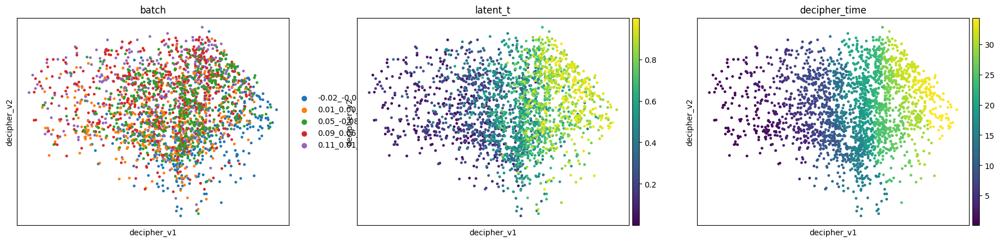

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-VZ-Add, sigma=0.1, seed=0, rho = 0.8567


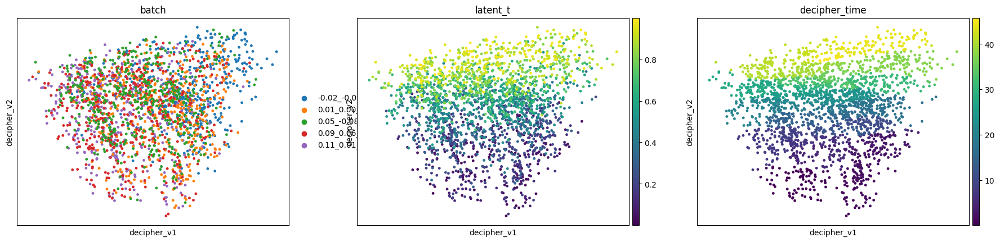

Decipher-VZ2-Add, sigma=0.1, seed=0, rho = 0.8572


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


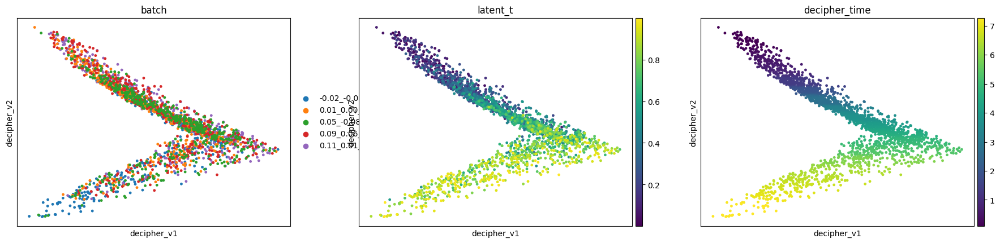

Decipher-MF-Add, sigma=0.1, seed=0, rho = 0.8610


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


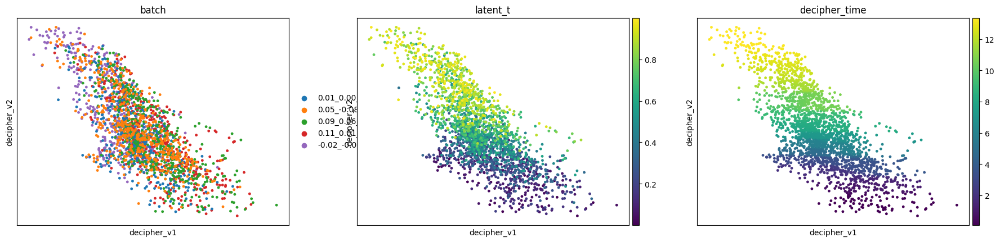

Base Decipher, sigma=0.1, seed=0, rho = 0.8578


In [15]:
plot_v_space(0.1)

### Sigma = 0.2

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


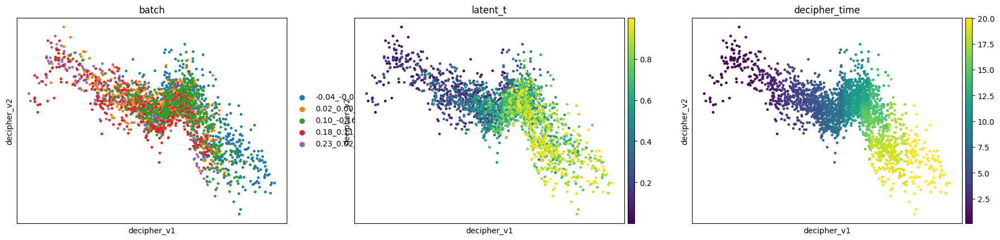

Decipher-VZ-Add, sigma=0.2, seed=0, rho = 0.7633


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


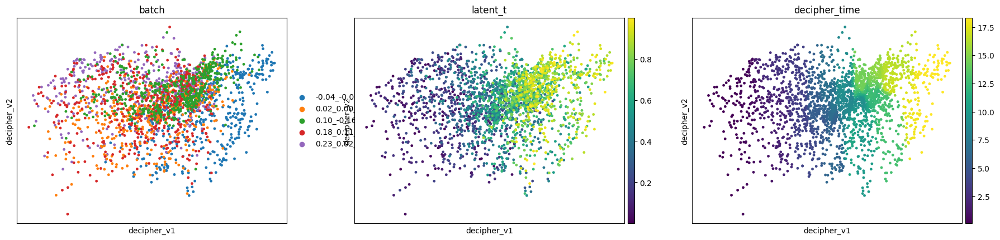

Decipher-VZ2-Add, sigma=0.2, seed=0, rho = 0.7748


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


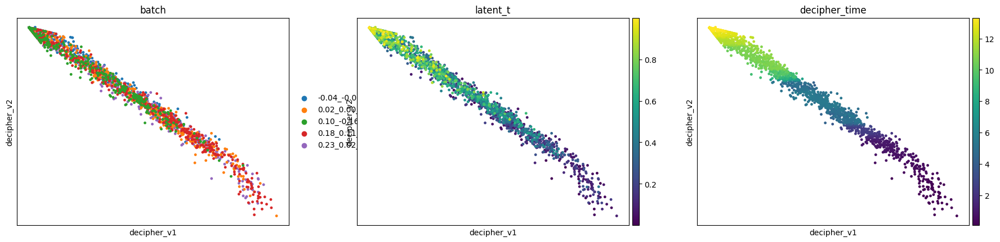

Decipher-MF-Add, sigma=0.2, seed=0, rho = 0.7295


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


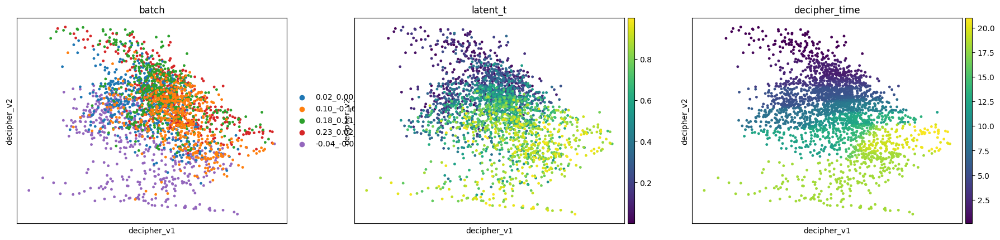

Base Decipher, sigma=0.2, seed=0, rho = 0.7700


In [16]:
plot_v_space(0.2)

### Sigma = 0.3

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


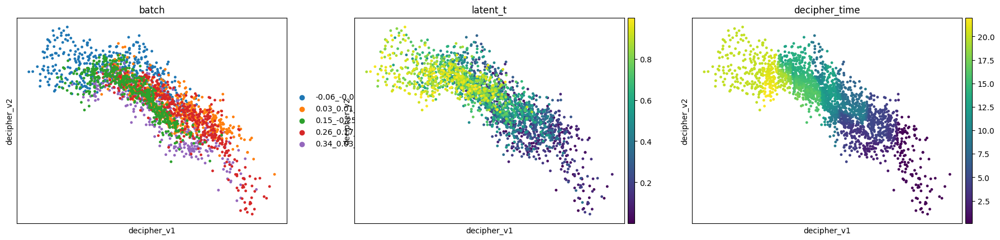

Decipher-VZ-Add, sigma=0.3, seed=0, rho = 0.7120


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


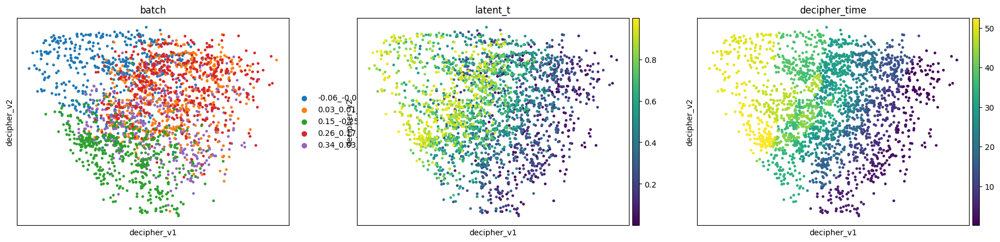

Decipher-VZ2-Add, sigma=0.3, seed=0, rho = 0.7299


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


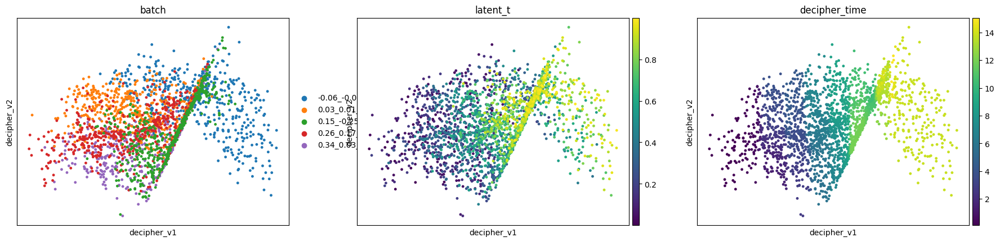

Decipher-MF-Add, sigma=0.3, seed=0, rho = 0.6886


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


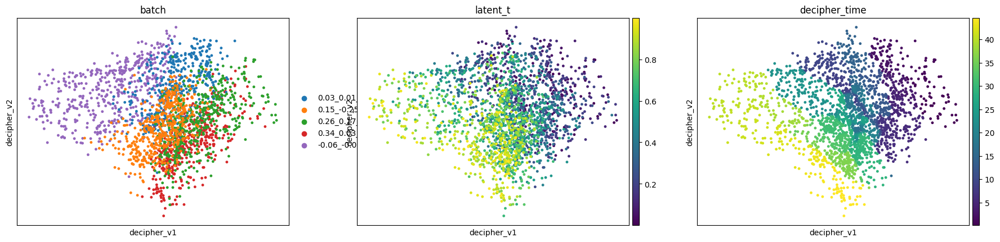

Base Decipher, sigma=0.3, seed=0, rho = 0.6948


In [17]:
plot_v_space(0.3)

## X-space: colored by batch

In [18]:
def plot_x_space(shift_sigma, seed=seed_for_detail, use_umap=False, n_pcs=20):
    for model_name in model_names:
        row, adata = load_run(run_log_df, shift_sigma, model_name, seed=seed)

        sc.pp.pca(adata, n_comps=min(n_pcs, adata.n_vars - 1), random_state=0)
        sc.pl.embedding(adata, basis="pca", color="batch",
                         title=f"{model_name}, sigma={shift_sigma}, X-space PCA")

        if use_umap:
            sc.pp.neighbors(adata, use_rep="X_pca", random_state=42)
            sc.tl.umap(adata, random_state=42)
            sc.pl.embedding(adata, basis="umap", color="batch",
                             title=f"{model_name}, sigma={shift_sigma}, X-space UMAP")

### Sigma = 0.1

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


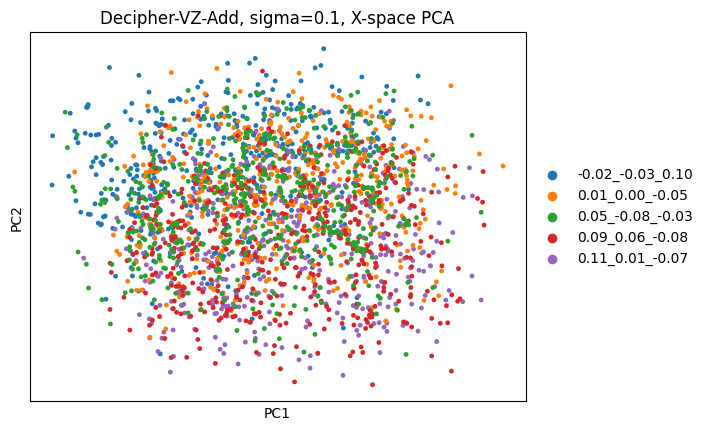

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


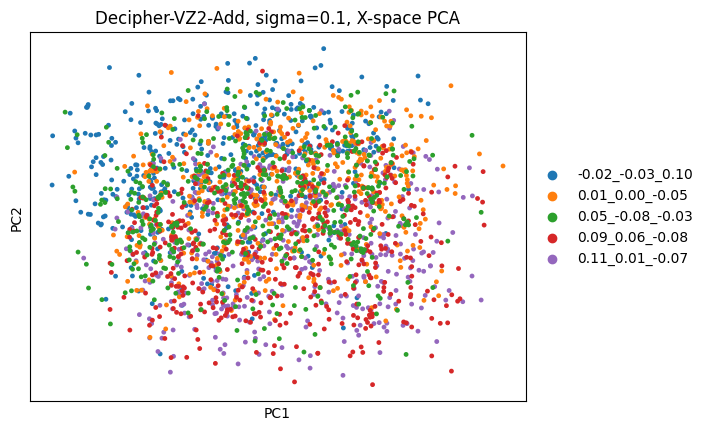

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


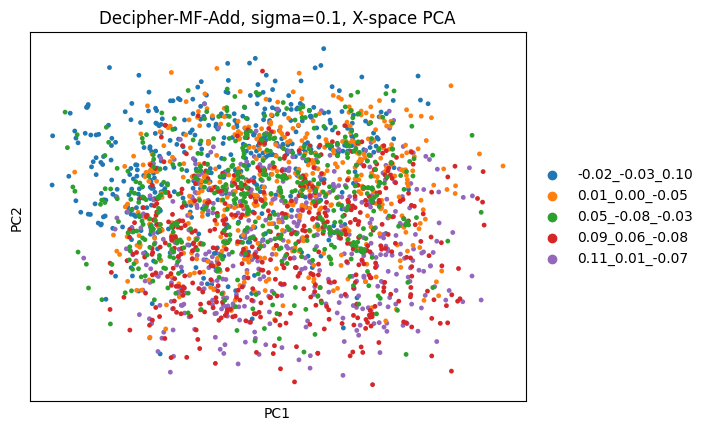

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


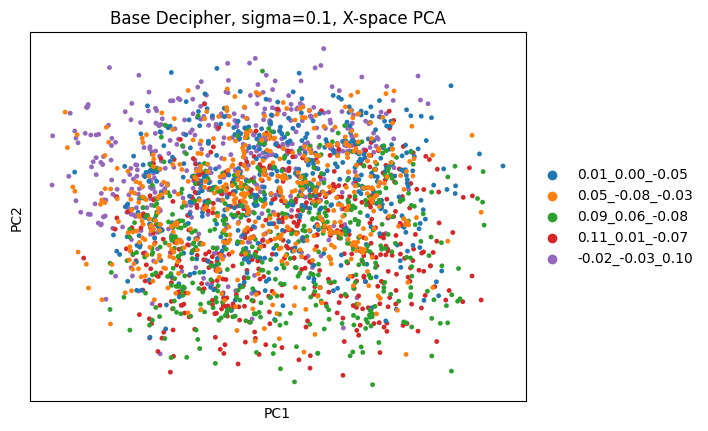

In [19]:
plot_x_space(0.1)

### Sigma = 0.2

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


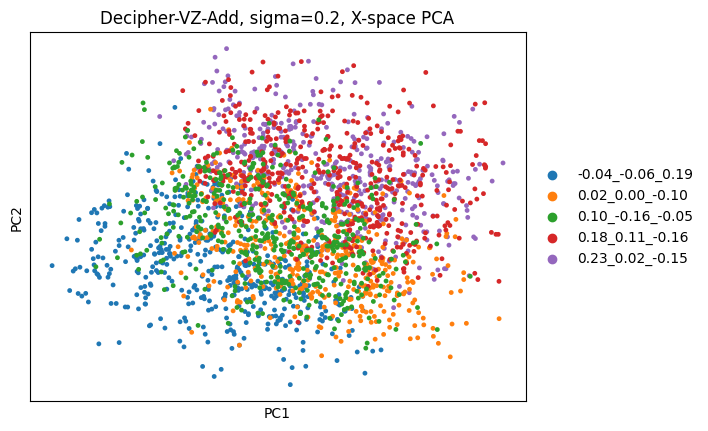

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


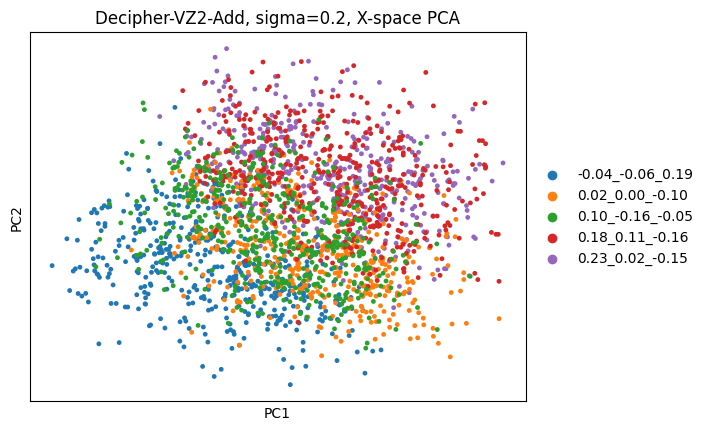

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


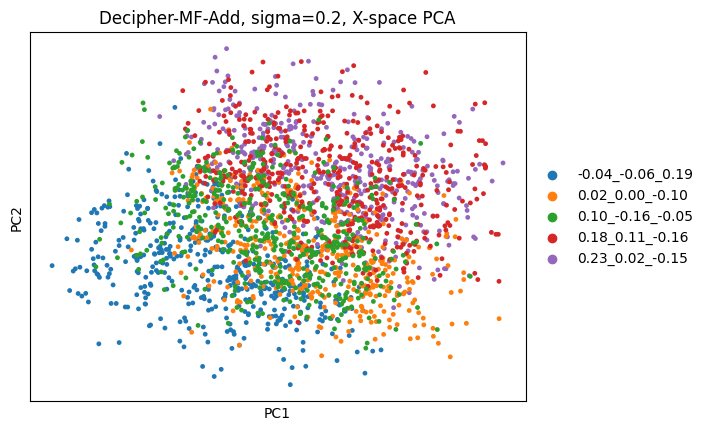

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


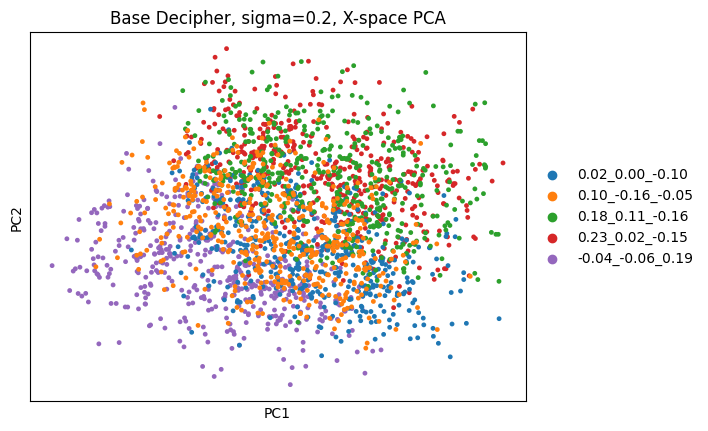

In [20]:
plot_x_space(0.2)

### Sigma = 0.3

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


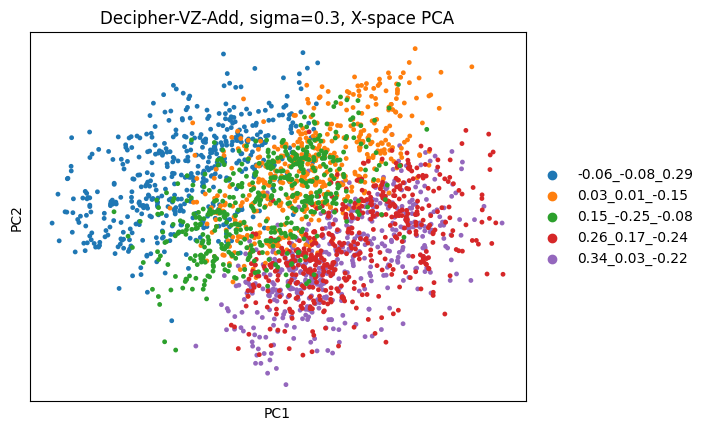

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


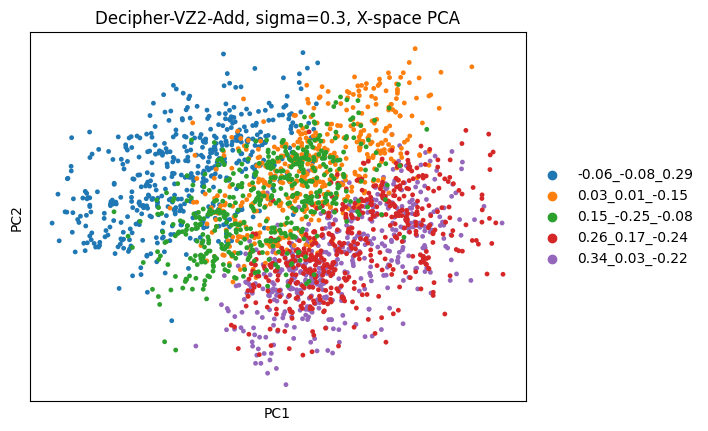

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


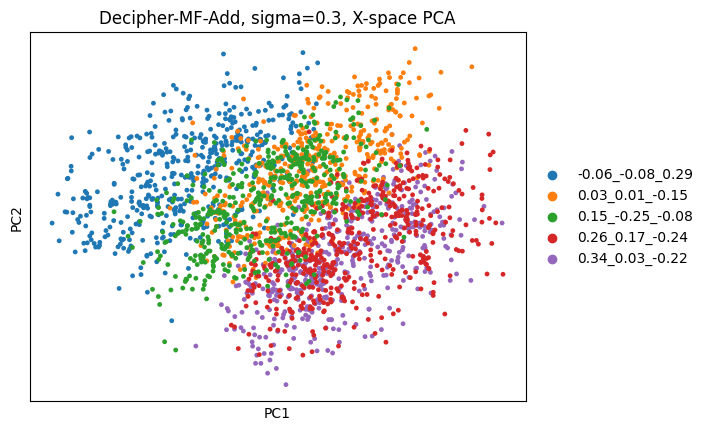

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


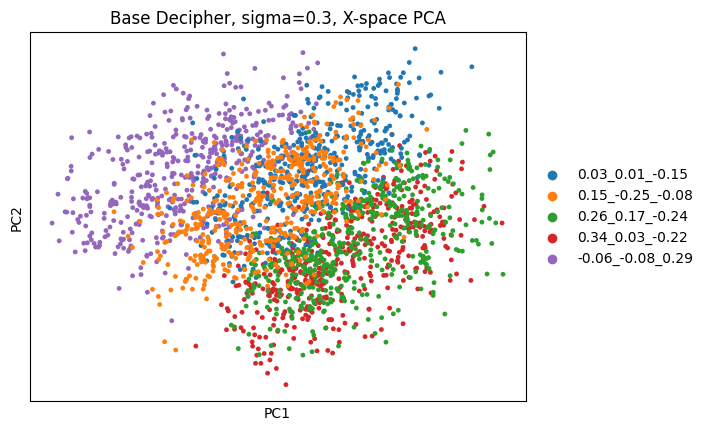

In [21]:
plot_x_space(0.3)